In [140]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math

# 1

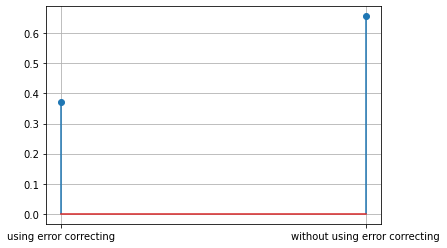

In [36]:
def binomial_rv(n,k,p):
    prob = math.comb(n,k)*(p**k)*((1-p)**(n-k))
    return prob

W_hamm_code = binomial_rv(4,0,0.1)
hamm_code = binomial_rv(7,1,0.1)

data = {'using error correcting': hamm_code,'without using error correcting':W_hamm_code}
names = list(data.keys())
values = list(data.values())
plt.stem(names,values)
plt.grid()

## 2.  Let X1 , X2,... , X100,  be independent and uniformly distributed random variables over [0,1] and Y = summation(Xi). Generate the probability density function (PDF) of Y .

/Users/himanshubairwa/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


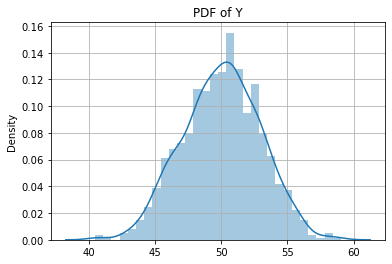

In [38]:
pdf = []
y_sum = 0
for i in range(1000):
    X = np.random.uniform(0,1,100)
    y_sum = np.sum(X)
    pdf.append(y_sum)
    
sns.distplot(pdf,30)
plt.title('PDF of Y')
plt.grid()
    


# 3

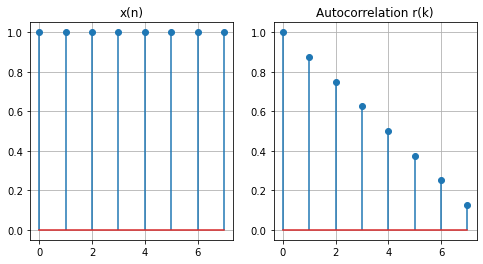

In [59]:
def autocorr(x):
    N = len(x)
    r = np.zeros(N)
    for k in range(N):
        for i in range(N):
            if(i-k<0):
                r[k] += 0
            else:
                r[k] += (x[i]*x[i-k])/N
    return r

n = [i for i in range(8)]
x = [1 for i in range(8)]
r = autocorr(x)
 
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

axes[0].stem(n,x)
axes[0].set_title("x(n)")
axes[0].grid()

axes[1].stem(n,r)
axes[1].set_title("Autocorrelation r(k)")
axes[1].grid()

## 4. (a) Generate N samples of zero mean with unit variance white Gaussian noise. Plot the histogram.

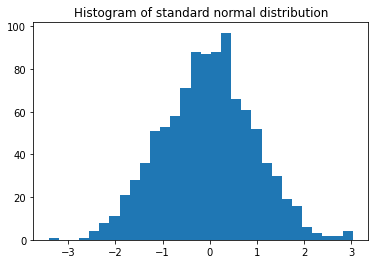

In [48]:
white_noise  = np.random.normal(0, 1, 1000)
plt.hist(white_noise,bins = 30)
plt.title('Histogram of standard normal distribution')
plt.show()

## 4.(b) Estimate the first M lags of the autocorrelation sequence using the sample autocorrelation as
## rˆx(k) = 1/N ∑ { x(n)x(n − k)  from 0 to N-1

## Determine that how close is your estimate to the true autocorrelation sequence rx(k) = δ(k)?

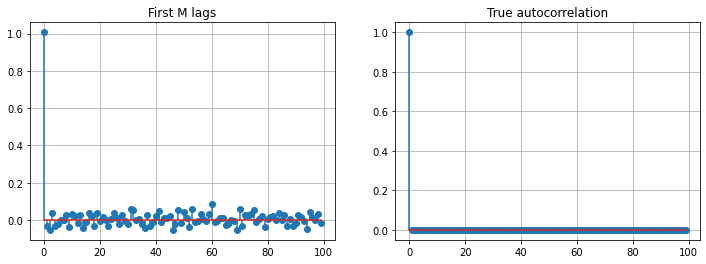

In [50]:
N = 1000
x = np.random.randn(N)
M = 100
r = autocorr(x)[0:M] 
true_autocorr = [1] + [0 for i in range(M-1)]
n = [i for i in range(M)]

fig,axes = plt.subplots(1,2,figsize=(12,4))
axes[0].stem(n,r)
axes[0].set_title("First M lags")
axes[0].grid()

axes[1].stem(n,true_autocorr)
axes[1].set_title("True autocorrelation")
axes[1].grid()


### As we keep on increasing the number of samples in autocorrelation function then it tends to exhibit the property of true autocorrelation function and by this we can say that it is getting closer true autocorrelation .

# 4(c). 

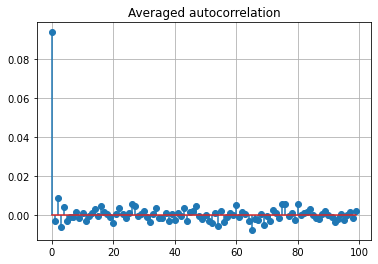

In [56]:
def averaged_autocorr(x,M=100):
    N = len(x)
    r = np.zeros(M)
    for k in range(M):
        for m in range(10): # 10 different parts
            for n in range(M):
                if(n-k+100*m<0):
                    r[k] += 0
                else:
                    r[k] += (x[n+100*m]*x[n-k+100*m])/N
    return r
    
x = np.random.randn(N)
M = 100
r_avg = averaged_autocorr(x)
true_autocorr = [1] + [0 for i in range(M-1)]
n = [i for i in range(M)]

plt.stem(n,r_avg)
plt.title("Averaged autocorrelation")
plt.grid()


# 4(d). 

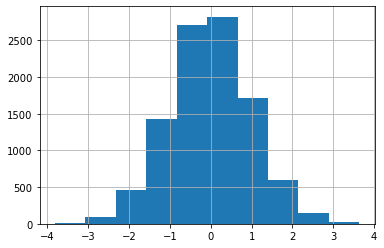

In [60]:
N = 10000
x = np.random.randn(N) # N samples from standard normal distribution (white noise distribution)

M_lag = 100
r = autocorr(x)[0:M_lag] # First M lags of autocorrelation
n = [i for i in range(M_lag)]

plt.hist(x)
plt.grid()


# 5 Download the “seeds” dataset from https://archive.ics.uci.edu/ ml/machine-learning-databases/00236/seeds_dataset.txt. It con- sists of 7 features. More details about the dataset can be found at https://archive.ics.uci.edu/ml/datasets/seeds. Define two cus- tom functions (one for correlation and other for covariance), where each function takes two features as input and returns the correlation or covariance between the features as output. Use these functions to calculate the correlation and covariance between every possible pair of features in the dataset and display the result in the form of table (You are not allowed to use any inbuilt functions). Compare your function results with the inbuilt functions and tabulate them.


In [113]:
import pandas as pd

In [114]:
df = pd.read_csv('Seed_Data.csv')
df = df.drop(['target'], axis=1) 
df

,A,P,C,LK,WK,A_Coef,LKG
0,15.26,14.84,0.8710,5.763,3.312,2.221,5.220
1,14.88,14.57,0.8811,5.554,3.333,1.018,4.956
2,14.29,14.09,0.9050,5.291,3.337,2.699,4.825
3,13.84,13.94,0.8955,5.324,3.379,2.259,4.805
4,16.14,14.99,0.9034,5.658,3.562,1.355,5.175
...,...,...,...,...,...,...,...
205,12.19,13.20,0.8783,5.137,2.981,3.631,4.870
206,11.23,12.88,0.8511,5.140,2.795,4.325,5.003
207,13.20,13.66,0.8883,5.236,3.232,8.315,5.056
208,11.84,13.21,0.8521,5.175,2.836,3.598,5.044


In [115]:
def covariance(x,y):
    
    x1=[]
    y1=[]
    num=0
    mean_x=(np.sum(x))/(len(x))
    mean_y=(np.sum(y))/(len(y))
    
    for i in x:
        x1.append(i-mean_x)
    
   
    for j in y:
        y1.append(j-mean_y)
    
    for k in range(len(x1)):
        num=num+(x1[k]*y1[k])
        
    return num/(len(x1)-1)

In [116]:
def correlation_coefficient(x,y):
    x1=[]
    y1=[]
    num=0
    den1=0
    den2=0
    mean_x=(np.sum(x))/(len(x))
    mean_y=(np.sum(y))/(len(y))
    
    for i in x:
        x1.append(i-mean_x)
    
   
    for j in y:
        y1.append(j-mean_y)
    
   
    for k in range(len(x1)):
        
        num=num+(x1[k]*y1[k])
        den1=den1+((x1[k])**2)
        den2=den2+((y1[k])**2)
    
    return num/np.sqrt(den1*den2)

In [117]:
A = df['A'].to_list()
P = df['P'].to_list()
C = df['C'].to_list()
LK = df['LK'].to_list()
WK = df['WK'].to_list()
A_Coef = df['A_Coef'].to_list()
LKG = df['LKG'].to_list()
S = [A,P,C,LK,WK,A_Coef,LKG]

In [118]:
""" for feature A """
cor_coff_A = []
cov_A = []
std_cor_coff_A = []
std_cov_A = []
for i in range(len(S)):
        cor_coff_A.append(correlation_coefficient(S[0],S[i]))
        cov_A.append(covariance(S[0],S[i]))
        std_cor_coff_A.append(np.corrcoef(S[0],S[i])[0][1])
        std_cov_A.append(np.cov(S[0],S[i])[0][1])

In [119]:
Column = ['A and A', 'A and P','A and C', 'A and LK','A and WK', 'A and A_Coef','A and LKG']
Data_A = {'Column':Column,'Correlation Coefficient':cor_coff_A,'Covariance':cov_A,
          'Std Correlation Coefficient':std_cor_coff_A,'Std Covariance':std_cov_A}
D_A = pd.DataFrame(Data_A)
D_A

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,A and A,1.000000,8.466351,1.000000,8.466351
1,A and P,0.994341,3.778443,0.994341,3.778443
2,A and C,0.608288,0.041823,0.608288,0.041823
3,A and LK,0.949985,1.224704,0.949985,1.224704
4,A and WK,0.970771,1.066911,0.970771,1.066911
5,A and A_Coef,-0.229572,-1.004356,-0.229572,-1.004356
6,A and LKG,0.863693,1.235133,0.863693,1.235133


In [120]:
""" for feature P """
cor_coff_P = []
cov_P = []
std_cor_coff_P = []
std_cov_P = []
for i in range(len(S)):
        cor_coff_P.append(correlation_coefficient(S[1],S[i]))
        cov_P.append(covariance(S[1],S[i]))
        std_cor_coff_P.append(np.corrcoef(S[1],S[i])[0][1])
        std_cov_P.append(np.cov(S[1],S[i])[0][1])

In [121]:
Column = ['P and A', 'P and P','P and C', 'P and LK','P and WK', 'P and A_Coef','P and LKG']
Data_P = {'Column':Column,'Correlation Coefficient':cor_coff_P,'Covariance':cov_P,
          'Std Correlation Coefficient':std_cor_coff_P,'Std Covariance':std_cov_P}
D_P = pd.DataFrame(Data_P)
D_P

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,P and A,0.994341,3.778443,0.994341,3.778443
1,P and P,1.000000,1.705528,1.000000,1.705528
2,P and C,0.529244,0.016332,0.529244,0.016332
3,P and LK,0.972422,0.562666,0.972422,0.562666
4,P and WK,0.944829,0.466065,0.944829,0.466065
5,P and A_Coef,-0.217340,-0.426766,-0.217340,-0.426766
6,P and LKG,0.890784,0.571753,0.890784,0.571753


In [122]:
""" for feature C """
cor_coff_C= []
cov_C = []
std_cor_coff_C = []
std_cov_C = []
for i in range(len(S)):
        cor_coff_C.append(correlation_coefficient(S[2],S[i]))
        cov_C.append(covariance(S[2],S[i]))
        std_cor_coff_C.append(np.corrcoef(S[2],S[i])[0][1])
        std_cov_C.append(np.cov(S[2],S[i])[0][1])

In [123]:
Column = ['C and A', 'C and P','C and C', 'C and LK','C and WK', 'C and A_Coef','C and LKG']
Data_C = {'Column':Column,'Correlation Coefficient':cor_coff_C,'Covariance':cov_C,
          'Std Correlation Coefficient':std_cor_coff_C,'Std Covariance':std_cov_C}
D_C = pd.DataFrame(Data_C)
D_C

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,C and A,0.608288,0.041823,0.608288,0.041823
1,C and P,0.529244,0.016332,0.529244,0.016332
2,C and C,1.000000,0.000558,1.000000,0.000558
3,C and LK,0.367915,0.003852,0.367915,0.003852
4,C and WK,0.761635,0.006798,0.761635,0.006798
5,C and A_Coef,-0.331471,-0.011777,-0.331471,-0.011777
6,C and LKG,0.226825,0.002634,0.226825,0.002634


In [125]:
""" for feature LK """
cor_coff_LK = []
cov_LK = []
std_cor_coff_LK = []
std_cov_LK = []
for i in range(len(S)):
        cor_coff_LK.append(correlation_coefficient(S[3],S[i]))
        cov_LK.append(covariance(S[3],S[i]))
        std_cor_coff_LK.append(np.corrcoef(S[3],S[i])[0][1])
        std_cov_LK.append(np.cov(S[3],S[i])[0][1])

In [126]:
Column = ['LK and A', 'LK and P','LK and C', 'LK and LK','LK and WK', 'LK and A_Coef','LK and LKG']
Data_LK = {'Column':Column,'Correlation Coefficient':cor_coff_LK,'Covariance':cov_LK,
          'Std Correlation Coefficient':std_cor_coff_LK,'Std Covariance':std_cov_LK}
D_LK = pd.DataFrame(Data_LK)
D_LK

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,LK and A,0.949985,1.224704,0.949985,1.224704
1,LK and P,0.972422,0.562666,0.972422,0.562666
2,LK and C,0.367915,0.003852,0.367915,0.003852
3,LK and LK,1.000000,0.196305,1.000000,0.196305
4,LK and WK,0.860415,0.143992,0.860415,0.143992
5,LK and A_Coef,-0.171562,-0.114290,-0.171562,-0.114290
6,LK and LKG,0.932806,0.203125,0.932806,0.203125


In [128]:
""" for feature WK """

cor_coff_WK = []
cov_WK = []
std_cor_coff_WK = []
std_cov_WK = []
for i in range(len(S)):
        cor_coff_WK.append(correlation_coefficient(S[4],S[i]))
        cov_WK.append(covariance(S[4],S[i]))
        std_cor_coff_WK.append(np.corrcoef(S[4],S[i])[0][1])
        std_cov_WK.append(np.cov(S[4],S[i])[0][1])

In [129]:
Column = ['WK and A', 'WK and P','WK and C', 'WK and LK','WK and WK', 'WK and A_Coef','WK and LKG']
Data_WK = {'Column':Column,'Correlation Coefficient':cor_coff_WK,'Covariance':cov_WK,
          'Std Correlation Coefficient':std_cor_coff_WK,'Std Covariance':std_cov_WK}
D_WK = pd.DataFrame(Data_WK)
D_WK

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,WK and A,0.970771,1.066911,0.970771,1.066911
1,WK and P,0.944829,0.466065,0.944829,0.466065
2,WK and C,0.761635,0.006798,0.761635,0.006798
3,WK and LK,0.860415,0.143992,0.860415,0.143992
4,WK and WK,1.000000,0.142668,1.000000,0.142668
5,WK and A_Coef,-0.258037,-0.146543,-0.258037,-0.146543
6,WK and LKG,0.749131,0.139068,0.749131,0.139068


In [130]:
"""  for A_Coef """
cor_coff_A_Coef = []
cov_A_Coef = []
std_cor_coff_A_Coef = []
std_cov_A_Coef = []
for i in range(len(S)):
        cor_coff_A_Coef.append(correlation_coefficient(S[5],S[i]))
        cov_A_Coef.append(covariance(S[5],S[i]))
        std_cor_coff_A_Coef.append(np.corrcoef(S[5],S[i])[0][1])
        std_cov_A_Coef.append(np.cov(S[5],S[i])[0][1])

In [136]:
Column = ['A_Coef and A', 'A_Coef and P','A_Coef and C', 'A_Coef and LK','A_Coef and WK', 
          'A_Coef and A_Coef','A_Coef and LKG']
Data_A_Coef = {'Column':Column,'Correlation Coefficient':cor_coff_A_Coef,'Covariance':cov_A_Coef,
          'Std Correlation Coefficient':std_cor_coff_A_Coef,'Std Covariance':std_cov_A_Coef}
D_A_Coef = pd.DataFrame(Data_A_Coef)
D_A_Coef

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,A_Coef and A,-0.229572,-1.004356,-0.229572,-1.004356
1,A_Coef and P,-0.217340,-0.426766,-0.217340,-0.426766
2,A_Coef and C,-0.331471,-0.011777,-0.331471,-0.011777
3,A_Coef and LK,-0.171562,-0.114290,-0.171562,-0.114290
4,A_Coef and WK,-0.258037,-0.146543,-0.258037,-0.146543
5,A_Coef and A_Coef,1.000000,2.260684,1.000000,2.260684
6,A_Coef and LKG,-0.011079,-0.008187,-0.011079,-0.008187


In [133]:
""" for feature LKG """

cor_coff_LKG = []
cov_LKG = []
std_cor_coff_LKG = []
std_cov_LKG = []
for i in range(len(S)):
        cor_coff_LKG.append(correlation_coefficient(S[6],S[i]))
        cov_LKG.append(covariance(S[6],S[i]))
        std_cor_coff_LKG.append(np.corrcoef(S[6],S[i])[0][1])
        std_cov_LKG.append(np.cov(S[6],S[i])[0][1])

In [134]:
Column = ['LKG and A', 'LKG and P','LKG and C', 'LKG and LK','LKG and WK', 'LKG and A_Coef','LKG and LKG']
Data_LKG = {'Column':Column,'Correlation Coefficient':cor_coff_LKG,'Covariance':cov_LKG,
          'Std Correlation Coefficient':std_cor_coff_LKG,'Std Covariance':std_cov_LKG}
D_LKG = pd.DataFrame(Data_LKG)
D_LKG

,Column,Correlation Coefficient,Covariance,Std Correlation Coefficient,Std Covariance
0,LKG and A,0.863693,1.235133,0.863693,1.235133
1,LKG and P,0.890784,0.571753,0.890784,0.571753
2,LKG and C,0.226825,0.002634,0.226825,0.002634
3,LKG and LK,0.932806,0.203125,0.932806,0.203125
4,LKG and WK,0.749131,0.139068,0.749131,0.139068
5,LKG and A_Coef,-0.011079,-0.008187,-0.011079,-0.008187
6,LKG and LKG,1.000000,0.241553,1.000000,0.241553


# 6. Consider a random process X(t) = 5 sin (2t + φ1) + 6 cos (3t + φ2), where φ1 and φ2 are uniformly distributed in [−π,π] and [0,2π], re- spectively, and φ1 and φ2 are independent of each other.
# (a) Determine if X(t) is a Wide Sense Stationary (WSS) Process . If yes, plot X(t) and its auto-correlation sequence.

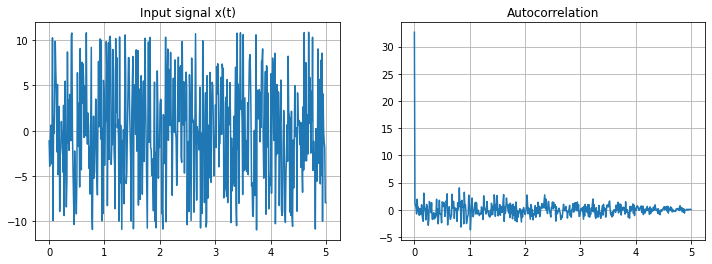

In [142]:
def x_t(t,phi1,phi2):
    return 5*np.sin(2*t+phi1) + 6*np.sin(3*t+phi2)

def autocorr(x):
    N = len(x)
    r = np.zeros(N)
    for k in range(N):
        for i in range(N):
            if(i-k<0):
                r[k] += 0
            else:
                r[k] += (x[i]*x[i-k])/N
    return r

phi1 = np.linspace(-np.pi,np.pi)
phi2 = np.linspace(0,2*np.pi)
t = np.linspace(0,5,500)
x = [x_t(i,np.random.choice(phi1),np.random.choice(phi2)) for i in t]
#x = [x_t(i,-np.pi/2,np.pi/2) for i in t]
r = autocorr(x)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))

axes[0].plot(t,x)
axes[0].set_title("Input signal x(t)")
axes[0].grid()

axes[1].plot(t,r)
axes[1].set_title("Autocorrelation")
axes[1].grid()

# 6(b)

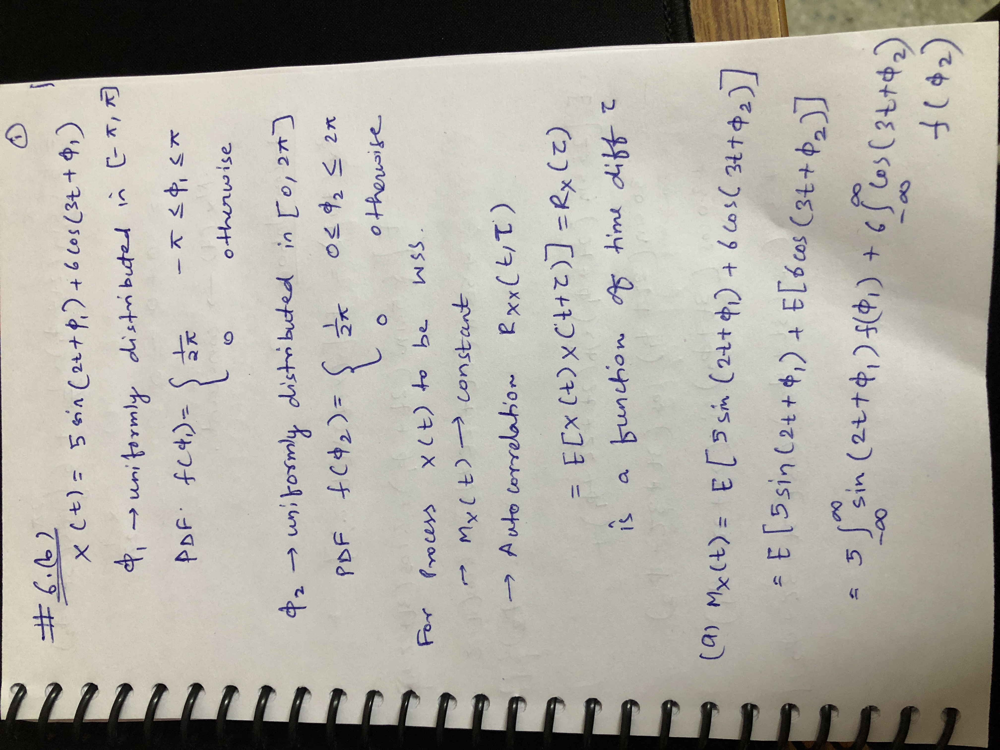

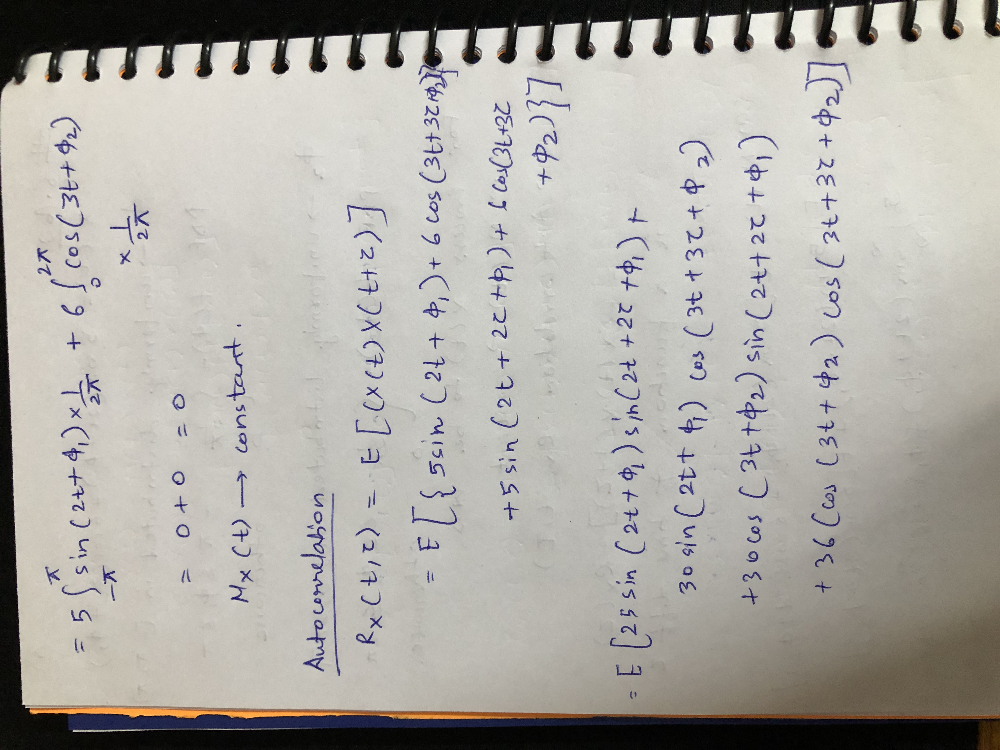

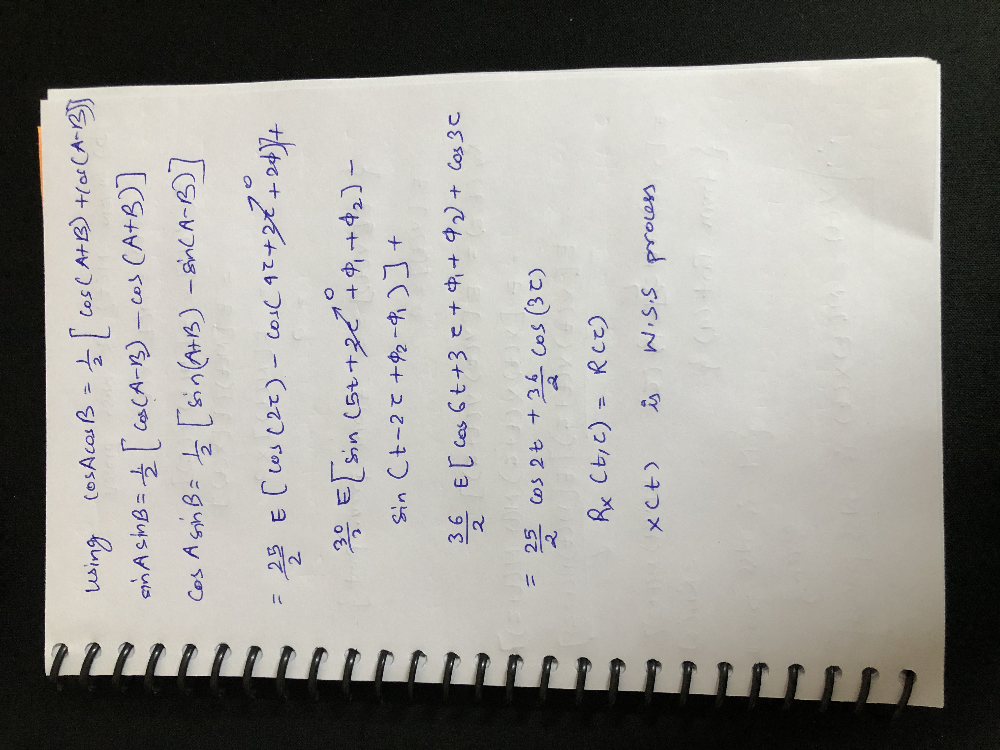

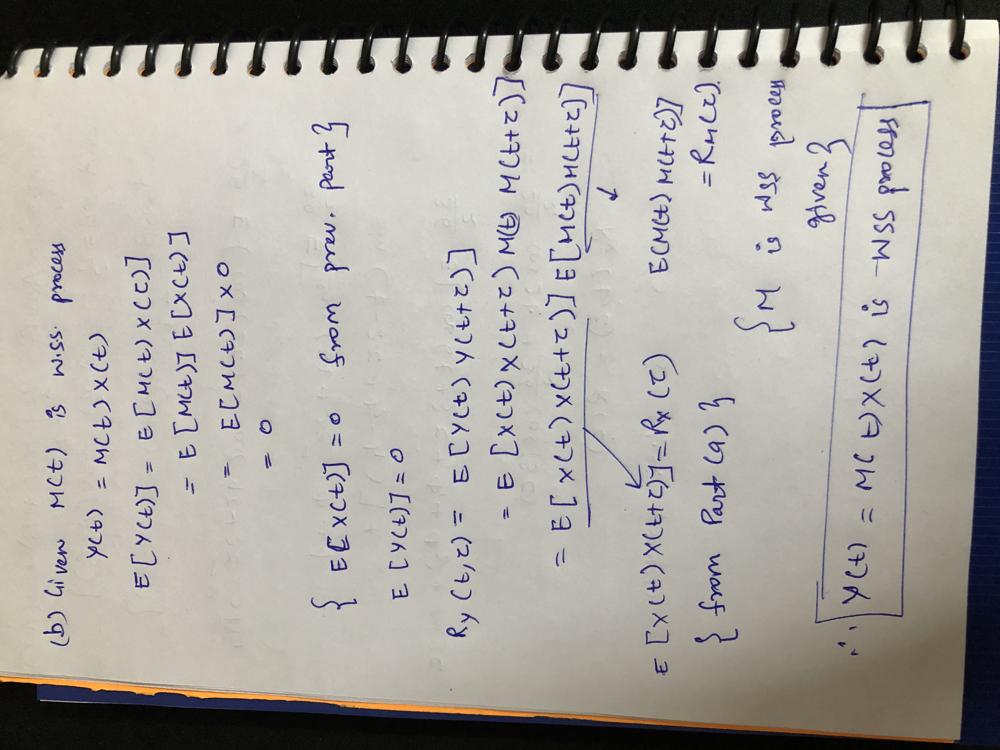

# 7(a). Draw out a sample for chi-squared distribution with degree of freedom 2 with size 2×3.


In [13]:
np.random.chisquare(2,size = (2,3))

array([[1.08657483, 0.74029398, 1.20821862],
       [2.01124609, 1.1323445 , 1.09070912]])

# 7(b). Visualize chi-square distribution with degree of freedom = [1, 4, 8, 12] for a size of 1000.

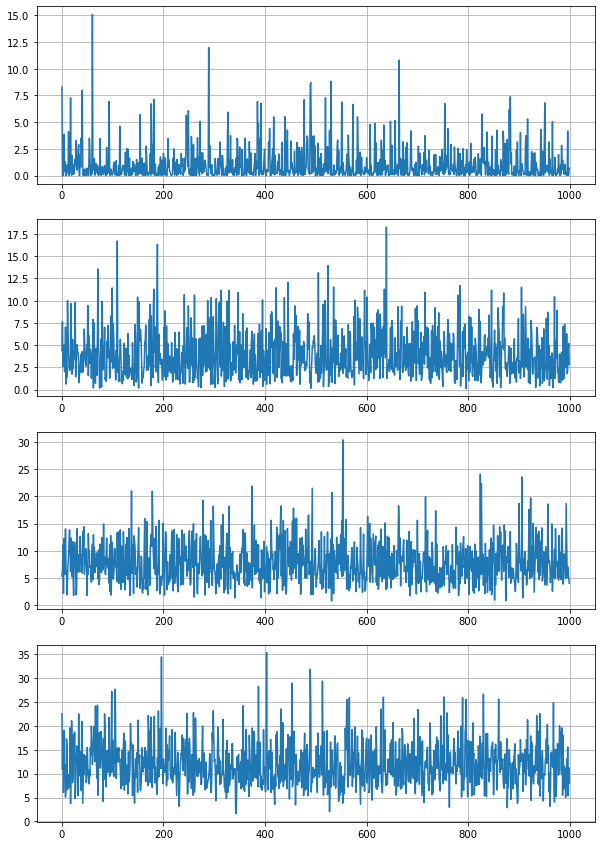

In [90]:
fig,axes = plt.subplots(4,1,figsize=(10,15))

n = np.arange(0,1000,1)
degree_freedom = [1,4,8,12]
for i in range(4):
    x = np.random.chisquare(degree_freedom[i],1000)
    axes[i].plot(n,x)
    axes[i].grid()

# 8(a).  Draw out a sample for exponential distribution with 2.0 scale with 2x3 size.

In [24]:
np.random.exponential(scale = 2 , size = (2,3))

array([[0.58233645, 1.88673664, 0.39547933],
       [0.05077145, 1.81508605, 9.07521866]])

# 8(b). Visualize exponential distribution for a size of 1000.


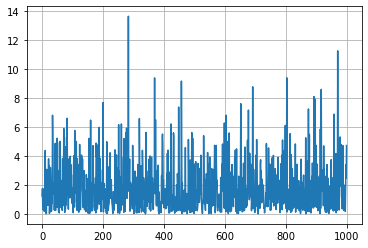

In [91]:
n = np.arange(0,1000)
x = np.random.exponential(scale = 2, size=1000)
plt.plot(n,x)
plt.grid()

# 9(a).  
## Generate a 1-D array containing 100 values, where each value has to be 2 , 4 , 6 or 8. The probability for the value to be 2 , 4 , 6 , and 8 is set to be 0.1 , 0.3 , 0.6 , 0 , respectively.

In [143]:
values = [2,4,6,8]
probability = [0.1,0.3,0.6,0]

np.random.choice(values,100,probability)

array([4, 2, 8, 2, 2, 4, 2, 8, 2, 6, 4, 2, 6, 8, 8, 2, 4, 8, 8, 2, 6, 8,
       4, 2, 8, 6, 2, 2, 2, 2, 8, 2, 4, 4, 2, 4, 8, 4, 8, 8, 2, 2, 4, 8,
       8, 4, 2, 8, 4, 6, 6, 2, 4, 6, 8, 8, 8, 2, 4, 6, 8, 4, 6, 4, 8, 2,
       4, 8, 2, 2, 6, 4, 2, 6, 4, 6, 6, 6, 4, 8, 6, 4, 8, 8, 6, 4, 6, 4,
       6, 6, 2, 4, 8, 2, 4, 2, 2, 2, 6, 8])

# 9(b).  
## For the same example as (a), return a 2-D array with 3 rows, each containing 5 values.


In [29]:
np.random.choice(values,(3,5),probability)

array([[4, 6, 2, 4, 2],
       [8, 2, 4, 4, 6],
       [4, 4, 4, 6, 2]])

# 10(a).  Generate central chi-squared distributed random variables with de- grees of freedom k = 1,2,3,4,5 and plot the PDFs. Write your own function, where the function takes input as degrees of freedom and returns output has chi-sqaured distributed random variable.


In [64]:
def chi_squared(x,k):
    f_1 = math.gamma(k/2)
    f_2 = 1/(((2)**(k/2))*f_1)
    f_3 = ((x)**((k/2)-1))*(np.exp(-(x/2)))*f_2
    return f_3

<ipython-input-64-0c93b70af8d7>:4: RuntimeWarning: divide by zero encountered in power
  f_3 = ((x)**((k/2)-1))*(np.exp(-(x/2)))*f_2


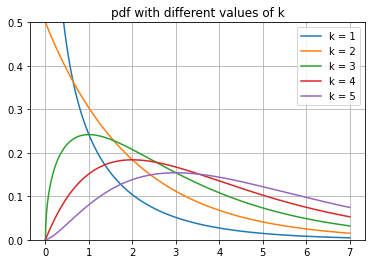

In [144]:
""" k = [1,2,3,4,5]"""
k = [1,2,3,4,5]
x = np.linspace(0,7,700)

plt.plot(x,chi_squared(x,k = 1),label='k = 1')
plt.plot(x,chi_squared(x,k = 2),label='k = 2')
plt.plot(x,chi_squared(x,k = 3),label='k = 3')
plt.plot(x,chi_squared(x,k = 4),label='k = 4')
plt.plot(x,chi_squared(x,k = 5),label='k = 5')
plt.title('pdf with different values of k')
plt.ylim(0,0.5)
plt.legend()
plt.grid()

    

# 10(b). Given the degrees of freedom k and non-centrality parameter λ, write a function to generate a sequence of random numbers that are non-central chi-squared distributed. Plot the PDFs for non-central chi- squared random variables for two different degrees of freedom k = 2 and k = 4, each with three different non-centrality parameters λ = 1, 2, 3.

In [103]:
def non_central_chi_squared(x,k,lamda):
    f1 = 0.5*(np.exp(-0.5*(x+lamda)))
    f2 = (x/lamda)**((k/4)-0.5)
    f3 = iv((0.5*k)-1,np.sqrt(lamda*x))
    f = f1*f2*f3
    return f

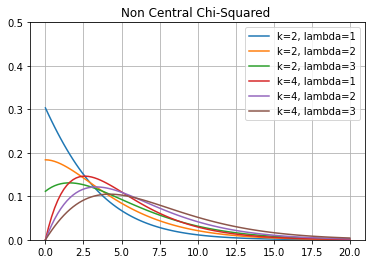

In [139]:

K = [2,4]
Lamda = [1,2,3]
L1 = ['k=2','k=4']
L2 = [', lambda=1',', lambda=2',', lambda=3']
x = np.linspace(0,20,100)
for i in range(len(K)):
    for j in range(len(Lamda)):
        plt.plot(x,non_central_chi_squared(x,K[i],Lamda[j]),label=L1[i]+L2[j])
        
plt.title('Non Central Chi-Squared ')
plt.ylim(0,0.5)
plt.legend()
plt.grid()